In [1]:
import os
import re
import json
import pandas as pd
import matplotlib.pyplot as plt
from bidi.algorithm import get_display
from arabic_reshaper import reshape
import matplotlib.font_manager as fm
import matplotlib
import matplotlib.colors as mcolors
from matplotlib.pyplot import figure

In [2]:
fm.fontManager.addfont('Sahel.ttf')
matplotlib.rc('font', family='Sahel')

In [3]:
def make_farsi_text(x):
    reshaped_text = reshape(x)
    farsi_text = get_display(reshaped_text)
    return farsi_text

In [5]:
def plot_result_per_category(metric):
    
    base_path = r"..\result"
    directories = next(os.walk(base_path))[1]
    models_name = [re.sub(r'_2022.*', '', d) for d in directories]
    categories = {1: make_farsi_text("حضور اشیا"),
                2: make_farsi_text("تشخیص ورزش"),
                3: make_farsi_text("استدلال مکان"),
                4: make_farsi_text("درک احساسات"),
                5: make_farsi_text("ویژگی‌های رنگ"),
                6: make_farsi_text("شمارش اشیا"),
                7: make_farsi_text("تشخیص فعالیت"),
                8: make_farsi_text("تشخیص اشیا"),
                9: make_farsi_text("جنس اشیا"),
                10: make_farsi_text("تشخیص جنسیت"),
                11: make_farsi_text("دیگر")}
    data = {
    'clip-fa_12heads_3_transformer':{},
    'clip-fa_12heads_4_transformer':{},
    'clip-fa_12heads_5_transformer':{},
    'clip-fa_bahdanau_attn_lstm':{},
    'clip-fa_luong_attn(dot)_lstm':{},
    'clip-fa_luong_attn(general)_lstm':{},
    'clip-fa_luong_attn(concat)_lstm':{},
    'clip-fa_bahdanau_attn_gru':{},
    'clip-fa_luong_attn(dot)_gru':{},
    'clip-fa_luong_attn(general)_gru':{},
    'clip-fa_luong_attn(concat)_gru':{},
    'clip-fa_lstm_1_bidirectional':{},
    'clip-fa_lstm_2_bidirectional':{},
    'clip-fa_lstm_3_bidirectional':{},
    'clip-fa_gru_1_bidirectional':{},
    'clip-fa_gru_2_bidirectional':{},
    'clip-fa_gru_3_bidirectional':{},
    'clip-fa_lstm_1':{},
    'clip-fa_lstm_2':{},
    'clip-fa_lstm_3':{},
    'clip-fa_gru_1':{},
    'clip-fa_gru_2':{},
    'clip-fa_gru_3':{}}
    
    for dir, model in zip(directories, models_name):
        path = os.path.join(base_path, dir, 'evaluation_test_per_category.json')

        with open(path, 'r')  as file:
            result = json.load(file)
        
        if len(metric)>1:
            result = {categories[cat_id]: round(result[str(cat_id)][metric[0]][metric[1]]*100,2) for cat_id in range(1, 12)}
        else:
            result = {categories[cat_id]: round(result[str(cat_id)][metric[0]]*100,2) for cat_id in range(1, 12)} 
        
        data[model] = result
        
        
    df = pd.DataFrame(data).transpose()
    
    figure(figsize=(20, 10), dpi=300)

    plt.plot(df, '-o')

    # plt.xlabel(make_farsi_text('مدل'), fontsize=20)
    plt.ylabel(metric[0].capitalize(), fontsize=20)

    plt.legend(df.columns, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., title=make_farsi_text("دسته سوالات"), fontsize=20)

    plt.xticks(rotation = 90,fontsize=15)
    plt.yticks(fontsize=20)
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig(os.path.join(base_path, f'{metric[0]}.png'), bbox_inches="tight")
    # plt.show()

In [84]:
def invert_plot_result_per_category(metric):
    
    base_path = r"..\result"
    directories = next(os.walk(base_path))[1]
    models_name = [re.sub(r'_2022.*', '', d) for d in directories]
    categories = {1: make_farsi_text("حضور اشیا"),
                2: make_farsi_text("تشخیص ورزش"),
                3: make_farsi_text("استدلال مکان"),
                4: make_farsi_text("درک احساسات"),
                5: make_farsi_text("ویژگی‌های رنگ"),
                6: make_farsi_text("شمارش اشیا"),
                7: make_farsi_text("تشخیص فعالیت"),
                8: make_farsi_text("تشخیص اشیا"),
                9: make_farsi_text("جنس اشیا"),
                10: make_farsi_text("تشخیص جنسیت"),
                11: make_farsi_text("دیگر")}
    data = {
    'clip-fa_12heads_3_transformer':{},
    'clip-fa_12heads_4_transformer':{},
    'clip-fa_12heads_5_transformer':{},
    'clip-fa_bahdanau_attn_lstm':{},
    'clip-fa_luong_attn(dot)_lstm':{},
    'clip-fa_luong_attn(general)_lstm':{},
    'clip-fa_luong_attn(concat)_lstm':{},
    'clip-fa_bahdanau_attn_gru':{},
    'clip-fa_luong_attn(dot)_gru':{},
    'clip-fa_luong_attn(general)_gru':{},
    'clip-fa_luong_attn(concat)_gru':{},
    'clip-fa_lstm_1_bidirectional':{},
    'clip-fa_lstm_2_bidirectional':{},
    'clip-fa_lstm_3_bidirectional':{},
    'clip-fa_gru_1_bidirectional':{},
    'clip-fa_gru_2_bidirectional':{},
    'clip-fa_gru_3_bidirectional':{},
    'clip-fa_lstm_1':{},
    'clip-fa_lstm_2':{},
    'clip-fa_lstm_3':{},
    'clip-fa_gru_1':{},
    'clip-fa_gru_2':{},
    'clip-fa_gru_3':{}}
    
    for dir, model in zip(directories, models_name):
        path = os.path.join(base_path, dir, 'evaluation_test_per_category.json')

        with open(path, 'r')  as file:
            result = json.load(file)
        
        if len(metric)>1:
            result = {categories[cat_id]: round(result[str(cat_id)][metric[0]][metric[1]]*100,2) for cat_id in range(1, 12)}
        else:
            result = {categories[cat_id]: round(result[str(cat_id)][metric[0]]*100,2) for cat_id in range(1, 12)} 
        
        data[model] = result
        
        
    df = pd.DataFrame(data)
    
    figure(figsize=(15, 10))

    plt.plot(df, '-o')
    
    plt.ylabel(metric[0].capitalize(), fontsize=20)

    plt.legend(df.columns, bbox_to_anchor=(.1, 1.3), loc='upper left', ncol=4,  borderaxespad=0., fontsize=12)

    plt.xticks(rotation = 45,fontsize=18)
    plt.yticks(fontsize=20)
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig(os.path.join(base_path, f'{metric[0]}_inverse.png'), bbox_inches="tight")
    # plt.show()

In [82]:
def boxplot_result_per_category(metric):
    base_path = r"..\result"
    directories = next(os.walk(base_path))[1]
    models_name = [re.sub(r'_2022.*', '', d) for d in directories]
    categories = {1: make_farsi_text("حضور اشیا"),
                2: make_farsi_text("تشخیص ورزش"),
                3: make_farsi_text("استدلال مکان"),
                4: make_farsi_text("درک احساسات"),
                5: make_farsi_text("ویژگی‌های رنگ"),
                6: make_farsi_text("شمارش اشیا"),
                7: make_farsi_text("تشخیص فعالیت"),
                8: make_farsi_text("تشخیص اشیا"),
                9: make_farsi_text("جنس اشیا"),
                10: make_farsi_text("تشخیص جنسیت"),
                11: make_farsi_text("دیگر")}
    data = {
    'clip-fa_12heads_3_transformer':{},
    'clip-fa_12heads_4_transformer':{},
    'clip-fa_12heads_5_transformer':{},
    'clip-fa_bahdanau_attn_lstm':{},
    'clip-fa_luong_attn(dot)_lstm':{},
    'clip-fa_luong_attn(general)_lstm':{},
    'clip-fa_luong_attn(concat)_lstm':{},
    'clip-fa_bahdanau_attn_gru':{},
    'clip-fa_luong_attn(dot)_gru':{},
    'clip-fa_luong_attn(general)_gru':{},
    'clip-fa_luong_attn(concat)_gru':{},
    'clip-fa_lstm_1_bidirectional':{},
    'clip-fa_lstm_2_bidirectional':{},
    'clip-fa_lstm_3_bidirectional':{},
    'clip-fa_gru_1_bidirectional':{},
    'clip-fa_gru_2_bidirectional':{},
    'clip-fa_gru_3_bidirectional':{},
    'clip-fa_lstm_1':{},
    'clip-fa_lstm_2':{},
    'clip-fa_lstm_3':{},
    'clip-fa_gru_1':{},
    'clip-fa_gru_2':{},
    'clip-fa_gru_3':{}}

    for dir, model in zip(directories, models_name):
        path = os.path.join(base_path, dir, 'evaluation_test_per_category.json')

        with open(path, 'r')  as file:
            result = json.load(file)
        
        if len(metric)>1:
            result = {categories[cat_id]: round(result[str(cat_id)][metric[0]][metric[1]]*100,2) for cat_id in range(1, 12)}
        else:
            result = {categories[cat_id]: round(result[str(cat_id)][metric[0]]*100,2) for cat_id in range(1, 12)} 
        
        data[model] = result
        
        
    df = pd.DataFrame(data).transpose()

    figure(figsize=(15, 10))


    df.boxplot(column=['ﺎﯿﺷﺍ ﺭﻮﻀﺣ', 'ﺵﺯﺭﻭ ﺺﯿﺨﺸﺗ', 'ﻥﺎﮑﻣ ﻝﻻﺪﺘﺳﺍ', 'ﺕﺎﺳﺎﺴﺣﺍ ﮎﺭﺩ', 'ﮓﻧﺭ ﯼﺎﻫﯽﮔﮋﯾﻭ', 'ﺎﯿﺷﺍ ﺵﺭﺎﻤﺷ', 'ﺖﯿﻟﺎﻌﻓ ﺺﯿﺨﺸﺗ', 'ﺎﯿﺷﺍ ﺺﯿﺨﺸﺗ', 'ﺎﯿﺷﺍ ﺲﻨﺟ', 'ﺖﯿﺴﻨﺟ ﺺﯿﺨﺸﺗ', 'ﺮﮕﯾﺩ'])  

    plt.ylabel(metric[0].capitalize(), fontsize=20)

    plt.xticks(rotation = 45,fontsize=18)
    plt.yticks(fontsize=20)

    plt.tight_layout()
    plt.savefig(os.path.join(base_path, f'{metric[0]}_boxplot.png'), bbox_inches="tight")
    # plt.show()

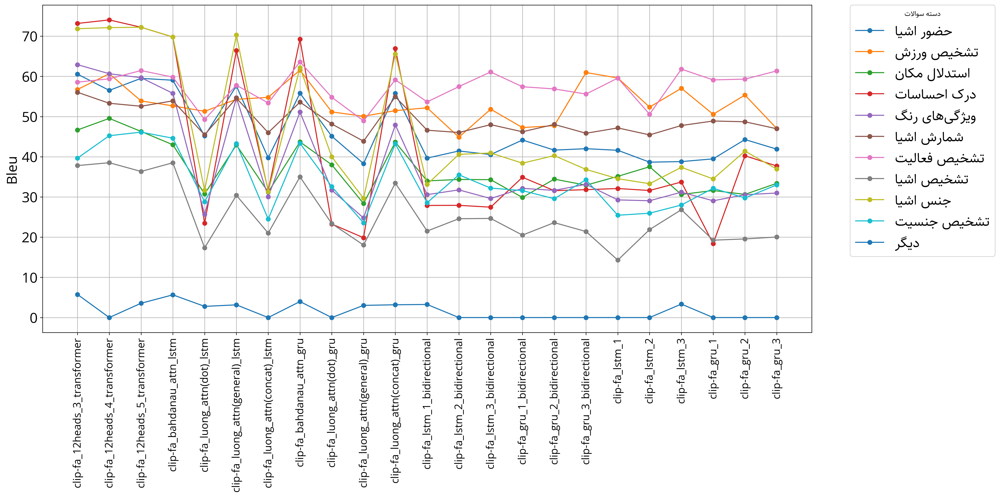

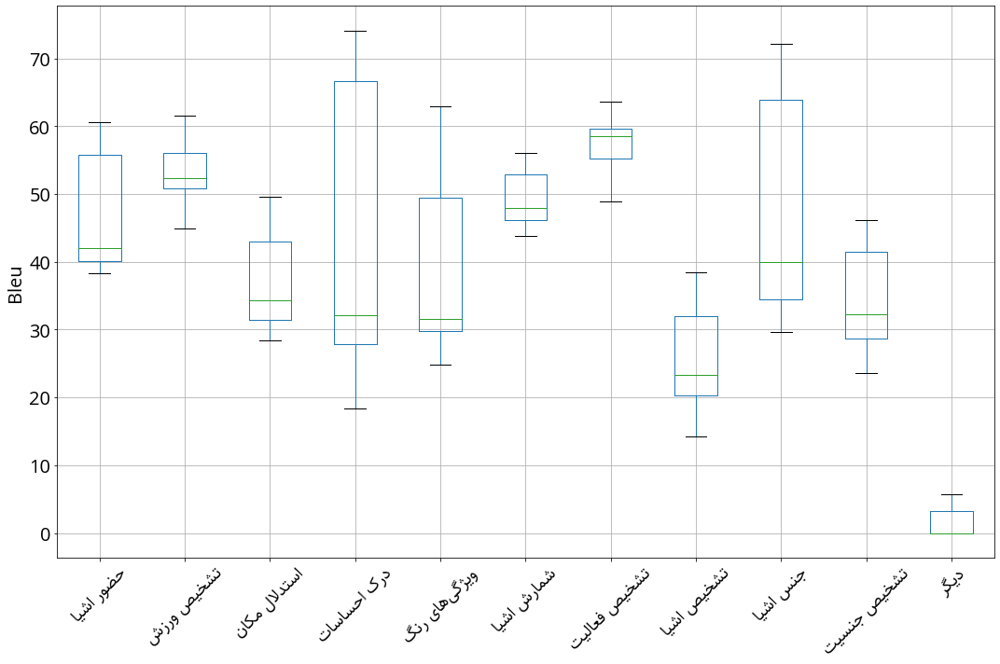

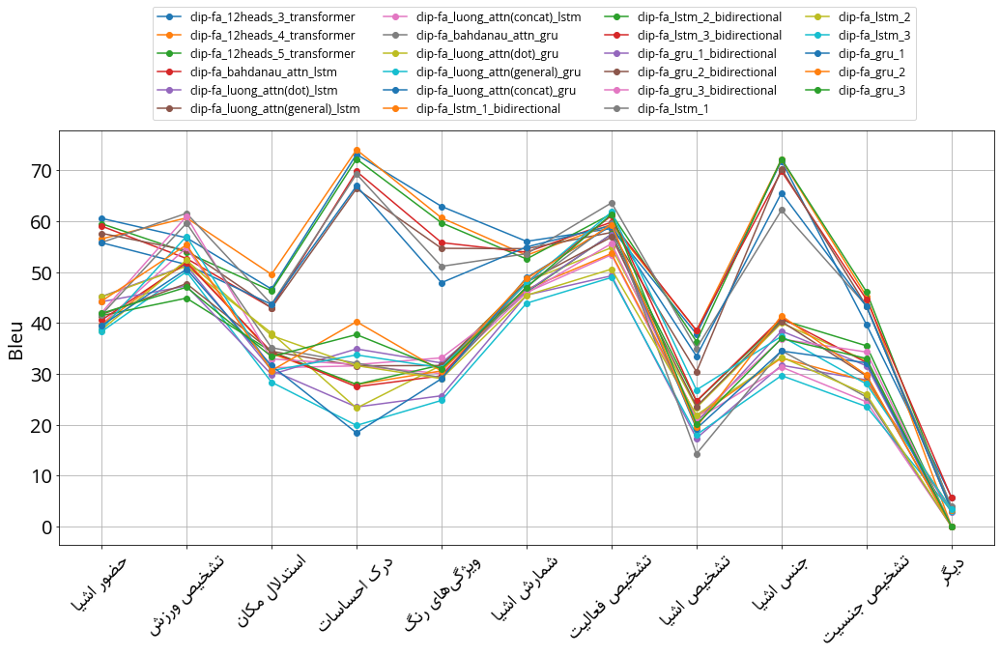

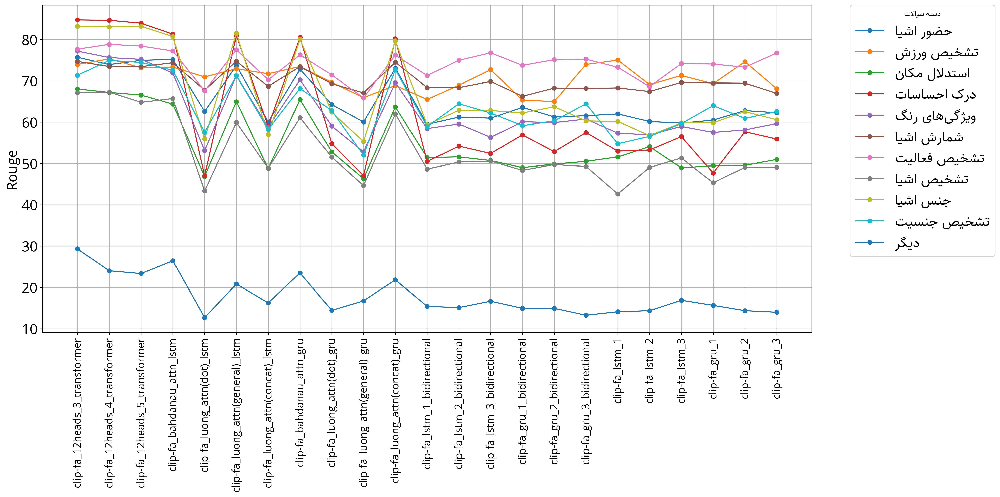

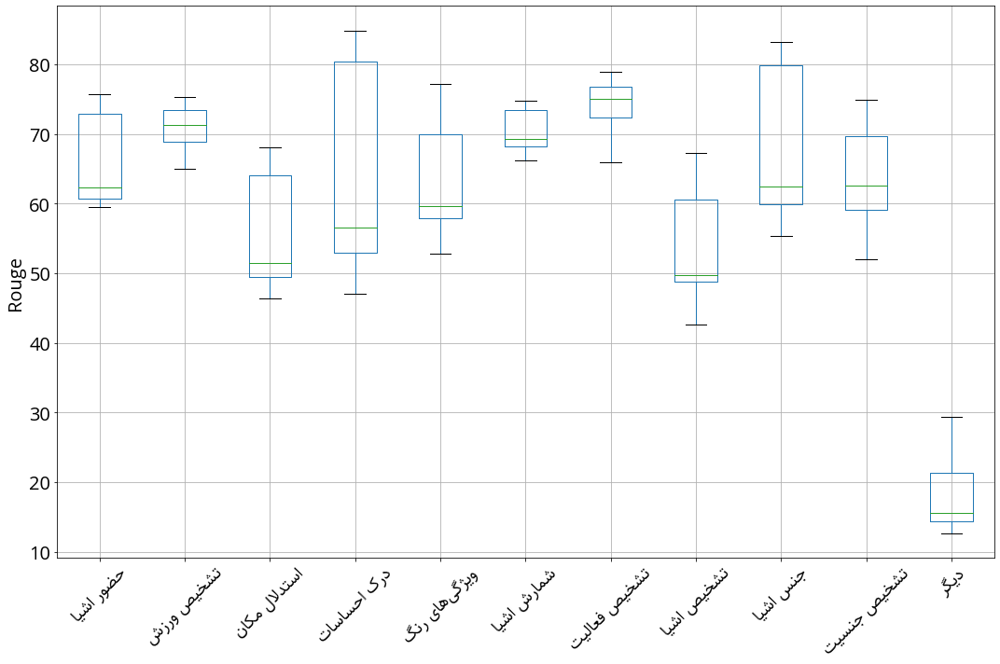

...

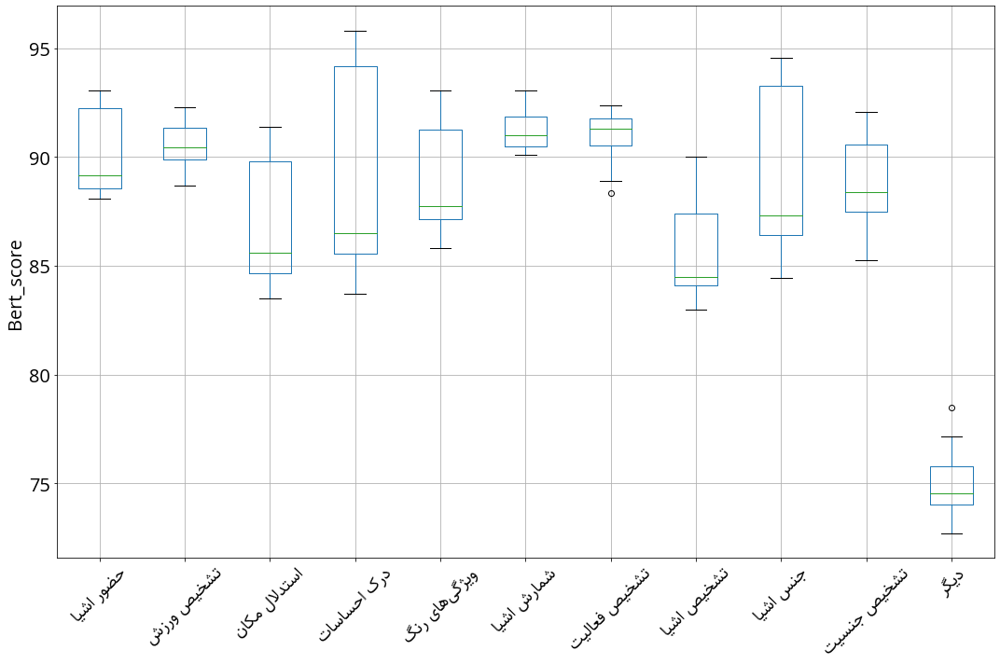

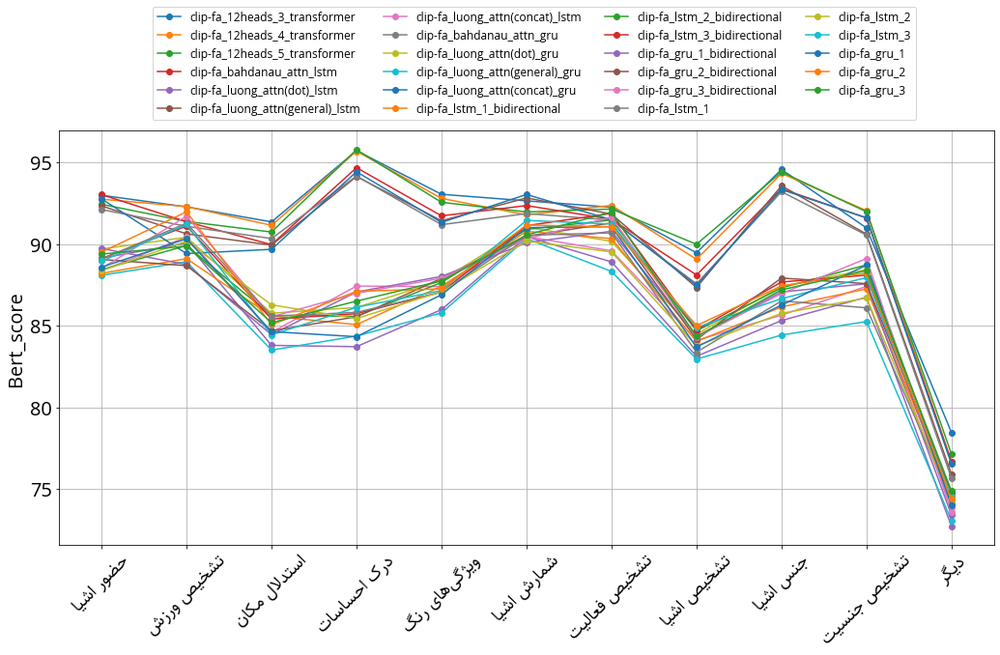

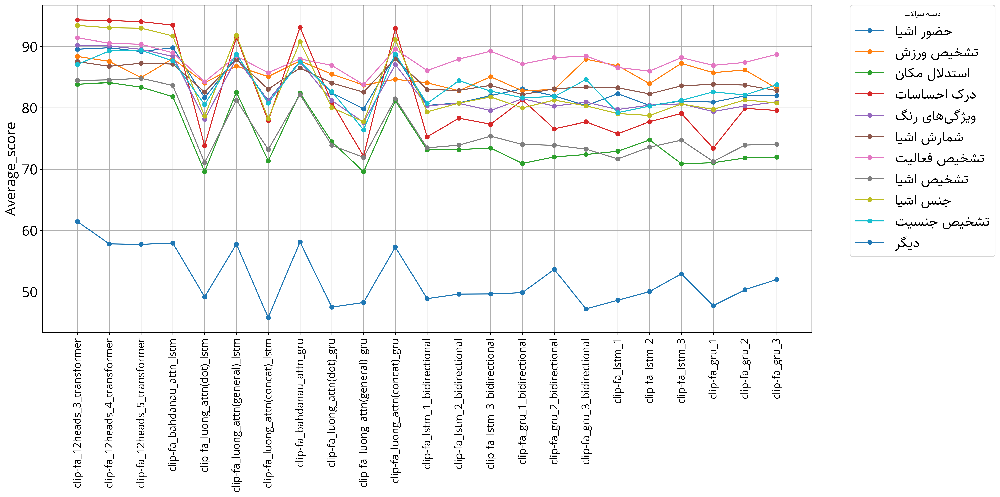

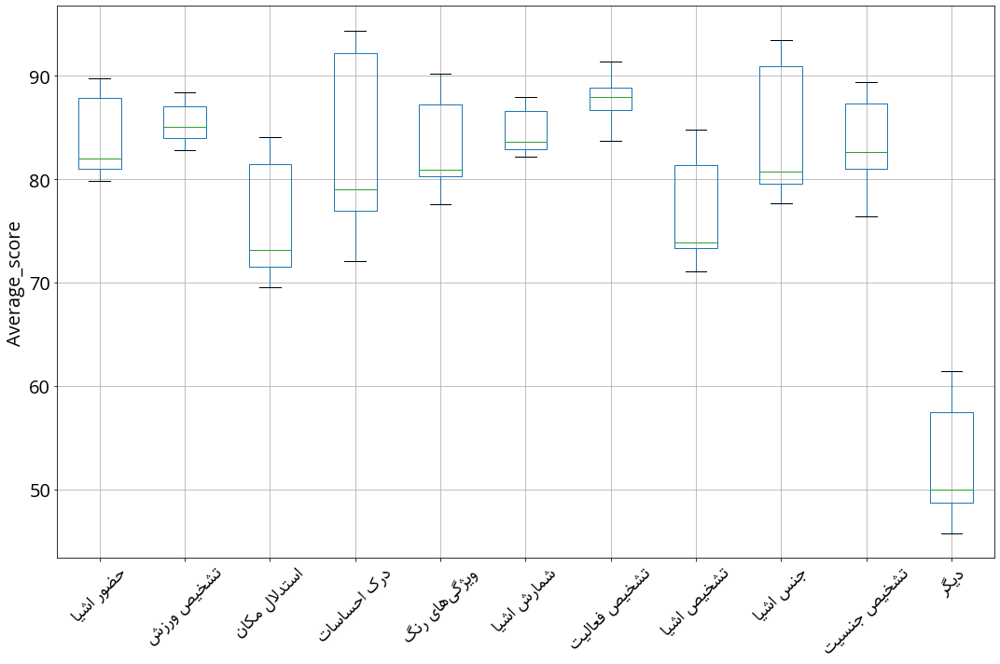

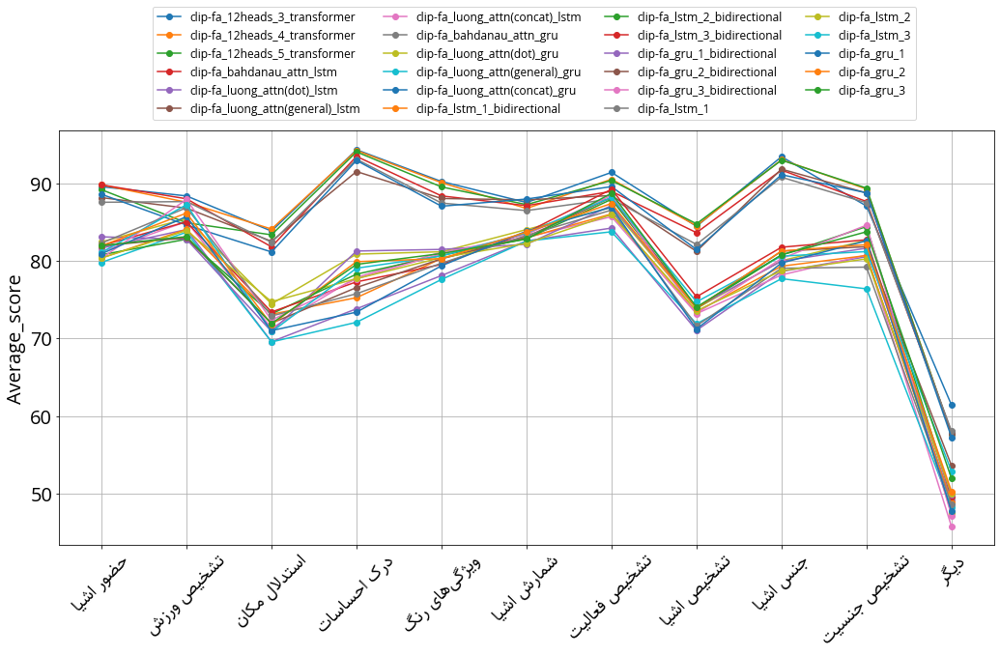

In [86]:
metrics = [
    ['bleu', 'bleu'],
    ['rouge', 'rougeL'],
    ['meteor', 'meteor'],
    ['bert_score', 'f1'],
    ['average_score'],
]

for metric in metrics:
    plot_result_per_category(metric)
    boxplot_result_per_category(metric)
    invert_plot_result_per_category(metric)